<h1 align='center'> Super green pass: la reazione della comunità italiana su Twitter </h1>
<h5 align='center'>- Progetto per il corso di Social Media Analytics -</h5>

L'obiettivo del progetto è quello di analizzare i pensieri e l'interazione degli utenti italiani attraverso i post social espressi tramite la piattaforma Twitter proprio nel giorno di entrata in vigore del super green pass. In particolare si vogliono ricercare le figure di riferimento presenti nella rete ma anche il sentimento e le emozioni delle persone rispetto alle nuove limitazioni.


Autori:
- Armanini Justin, 830103, j.armanini@campus.unimib.it\\
- Confalonieri Riccardo, 830404, r.confalonieri5@campus.unimib.it\\
- Cormio Chiara, 868708, c.cormio@campus.unimib.it

# Caricamento pacchetti
In questa sezione verranno installati e caricati tutti i pacchetti necessari per l'esecuzione del notebook.

In [ ]:
# libreria pyvis per visualizzare il grafo
!pip install -q pyvis #-q flag non visualizza l'output durante l'installazione

# libreria pywaffle per visualizzare pictorial fraction charts
! pip install -q pywaffle

# librerie con versione specifica richieste per la sentiment analysis
! pip install -q tensorflow==2.0.0 
! pip install -q spacy==2.3.2
! pip install -q keras==2.3.1
! pip install -q h5py==2.10.0
! pip install -q git+https://www.github.com/keras-team/keras-contrib.git
# download file necessari per la sentiment in lingua italiana
! python -m spacy download it
! python -m spacy download it_core_news_sm

     |████████████████████████████████| 565 kB 5.0 MB/s 
     |████████████████████████████████| 86.3 MB 42 kB/s 
     |████████████████████████████████| 449 kB 58.0 MB/s 
     |████████████████████████████████| 3.8 MB 42.2 MB/s 
     |████████████████████████████████| 50 kB 5.6 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.15.0 requires gast>=0.3.2, but you have gast 0.2.2 which is incompatible.
     |████████████████████████████████| 9.9 MB 5.3 MB/s 
     |████████████████████████████████| 2.1 MB 52.4 MB/s 
     |████████████████████████████████| 377 kB 5.1 MB/s 
     |████████████████████████████████| 2.9 MB 5.0 MB/s 
     |████████████████████████████████| 14.5 MB 4.8 MB/s 
  Created wheel for it-core-news-sm: filename=it_core_news_sm-2.3.0-py3-none-any.whl size=14502463 sha256=377a968ebd3788bbf25a05dd3301ea09cab23e5de7247dd

In [1]:
# libreria per collegamento a google drive
from google.colab import drive
drive.mount('/content/drive')

# per manipolare i percorsi delle cartelle
import os

Mounted at /content/drive


PATH FINO ALLA CARTELLA DEL PROGETTO: **VERIFICARE** CHE SIA CORRETTO POTREBBE VARIARE IN BASE ALL'UTENTE CHE ACCEDE

In [2]:
# ATTENZIONE: impostare il path corretto a seconda del proprio drive!!!!!!
drive_path = '/content/drive/MyDrive/SMA _Armanini_Confalonieri_Cormio/'

In [ ]:
''' 
# scaricamento il modello sentITa necessario per la sentiment analysis
os.chdir(drive_path + 'sentITa') 
!gdown --id 1s1BW3T_BysAhVZPai-3AUXpb68aYjQTS
!unzip sentita_0.2.0.zip
% cd sentita
! pip install .  '''

# path della cartella sentITa precedentemente scaricata
os.chdir(drive_path + "sentITa/sentita")

! pip install -q .

  DEPRECATION: A future pip version will change local packages to be built in-place without first copying to a temporary directory. We recommend you use --use-feature=in-tree-build to test your packages with this new behavior before it becomes the default.
   pip 21.3 will remove support for this functionality. You can find discussion regarding this at https://github.com/pypa/pip/issues/7555.


In [ ]:
# librerie per scaricamento dati da twitter
import tweepy

# per manipolazione dataset
import pandas as pd
import numpy as np
# per preprocessing sui testi
import unicodedata
import re
# per lavorare col grafo
import networkx as nx
import matplotlib.pyplot as plt
import cv2 as cv
from pyvis.network import Network # visualizzazione con pyvis

# algoritmo di modularity maximization per community detection
from networkx.algorithms.community import greedy_modularity_communities
# per score modularity
import networkx.algorithms.community as nx_comm
# centrality measures
from networkx.algorithms.centrality import (closeness_centrality, betweenness_centrality,
                                            harmonic_centrality)

# wordcloud
from wordcloud import WordCloud
# per eliminare stopwords dalla wordcloud
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
import math

# sentiment analysis
from sentita import calculate_polarity

# per visualizzazione sentiment
from pywaffle import Waffle

# per visualizzazione emotion
from pandas.plotting import parallel_coordinates
from matplotlib.colors import ListedColormap

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Using TensorFlow backend.


# Scaricamento dati (NON eseguire)

Viene riportato il codice per scaricare i dati utilizzati per il progetto. Dato che la versione gratuita della API di Twitter permette di raccogliere tweet pubblicati massimo una settimana prima, oggi sarebbe impossibile scaricare i dati raccolti per il progetto, i quali risalgono al 6 dicembre 2021. 

I dati utilizzati per il progetto sono stati raccolti tramite la API di Twitter impostando i seguenti parametri:


*   Data di pubblicazione: 6 dicembre 2021
*   Lingua del tweet: italiano
*   Hashtag per filtrare la ricerca: #supergreenpass, #greenpass, #novax, #nogreenpass, #greenpassrafforzato, #vaccino

## Autenticazione API Twitter

In [ ]:
# chiavi per l'accesso a twitter
consumer_key = "INSERIRE API PERSONALE"
consumer_secret = "INSERIRE API PERSONALE"
access_token = "INSERIRE API PERSONALE"
access_secret = "INSERIRE API PERSONALE"

# autenticazione
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
api = tweepy.API(auth, wait_on_rate_limit = True, wait_on_rate_limit_notify=True)

## Download dati 
Si procede quindi con lo scaricamento automatico dei dati. Il download procede finchè non si sono scaricati 10000 tweet, dopo di che si ferma. Lo scaricamento, per via dei limiti dell'account free di twitter, è soggetto a diversi timeout gestiti dalla libreria tweepy per evitare di incorrere in errori per eccessive richieste consecutive.

In [ ]:
# definisco le colonne per il salvataggio dei dati
df_col_names = ['date','id','text','n_rt','n_like','author_name', 'author_id', 
                'location', 'rt_authors', 'author_follower', 'author_friends']

# definisco hashtag da cercare
hashtag="#supergreenpass OR #greenpass OR #novax OR #nogreenpass OR #greenpassrafforzato OR #vaccino"

list_tweet=[]

print('...... Inizio scaricamento dati ......')
# imposto i miei paramenti di ricerca (lista hashtag, lingua italiana e data)
for tweet in tweepy.Cursor(api.search, q=hashtag, lang="it", since='2021-12-06', 
                           until = '2021-12-06', tweet_mode='extended').items():

  # estrazione del testo complesto in base al tipo di tweet
  if "retweeted_status" in tweet._json.keys():
    text = tweet._json["retweeted_status"]["full_text"]
  else:
    text = tweet.full_text

  # estraggo numero di followers e di following
  follower_count = tweet._json['user']['followers_count']
  friends_count = tweet._json['user']['friends_count']

  # aggiunta alla lista di tutte le informazioni
  list_tweet.append([tweet.created_at, tweet.id_str, text,
                    tweet.retweet_count, tweet.favorite_count, 
                    tweet.user.screen_name, tweet.user.id_str, tweet.user.location, 
                    tweet.entities['user_mentions'], follower_count, friends_count])

  # salvataggio del file su drive ogni 2500 righe per sicurezza
  if len(list_tweet) % 2500 == 0:
    print('...... Scaricati:', len(list_tweet), ' tweet ......' )
    tweets = pd.DataFrame(list_tweet[1:], columns=df_col_names)
    # estraggo gli hashtag dal testo
    tweets['hashtag'] = tweets['text'].apply(lambda x: re.findall(r"#(\w+)", x))
    tweets.to_csv(drive_path + "DATA/tweets_6Dicembre.csv", header = True, index = False)
  
  # dopo 10000 tweet non scarico oltre
  if len(list_tweet) >= 10000:
    break

print('Scaricamento completato! Disponibili:', len(list_tweet), 'tweet.')

In [ ]:
# finito il caricamento converto la lista con tutti i tweet in un dataframe per averla a disposizione
df = pd.DataFrame(list_tweet[1:], columns=df_col_names)
# estraggo gli hashtag dal testo
df['hashtag'] = df['text'].apply(lambda x: re.findall(r"#(\w+)", x))

In [ ]:
df.head(3) # visualizzazione delle prime 3 righe del dataframe

,date,id,text,n_rt,n_like,author_name,author_id,location,rt_authors,hashtag,author_follower,author_friends
0,2021-12-06 23:59:33,1468007234865188870,"Dissonanza cognitiva.\nUno studente per entrare a scuola non deve presentare il #greenpass, ma lo deve esibire per prendere il pulmino per recarsi a scuola.\n#NoGreenPass",52,0,PubblicoDebito,1074376096018247681,Italy,"[{'screen_name': 'ArmoniosiAccent', 'name': '🦢🏹🧱Isαbεllα®🇮🇹 ❥✞\u200fن', 'id': 1155459166380744709, 'id_str': '1155459166380744709', 'indices': [3, 19]}]","['greenpass', 'NoGreenPass']",133,292
1,2021-12-06 23:59:22,1468007186412584964,A quelli che parlano di sparute minoranze ricordo che in Unione Europea ci sono 150 milioni di persone non vaccinate. \nCentocinquanta milioni.\n\n#GreenPassrafforzato\n#supergreenpass,26,0,GiuliettaVanni,1341730716,NaN,"[{'screen_name': 'Ma_Messina', 'name': 'Marco Messina', 'id': 188277978, 'id_str': '188277978', 'indices': [3, 14]}]","['GreenPassrafforzato', 'supergreenpass']",1923,1990
2,2021-12-06 23:59:22,1468007186383224838,@giusbrindisi qualcuno ti ha cagato in bocca.\nL’apice di quel famoso diavolo che fa le pentole senza coperchi.\n\nSDENNNNNNNNNNG!\n\n#zonabianca #supergreenpass #GreenPassrafforzato #nogreenpass #terzadose #quartadose #QuartaRepubblica #dittatura #nazivax\n https://t.co/R7jFPlNcKT,5,4,unfruitfruitful,1348785813425950721,NaN,"[{'screen_name': 'giusbrindisi', 'name': '𝙶𝚒𝚞𝚜𝚎𝚙𝚙𝚎 𝙱𝚛𝚒𝚗𝚍𝚒𝚜𝚒', 'id': 30649504, 'id_str': '30649504', 'indices': [0, 13]}]","['zonabianca', 'supergreenpass', 'GreenPassrafforzato', 'nogreenpass', 'terzadose', 'quartadose', 'QuartaRepubblica', 'dittatura', 'nazivax']",76,10


# Preprocessing
I testi scaricati da twitter presentano molti elementi di rumore, per questo motivo prima di proseguire con le analisi si è deciso di effettuare una fase di preprocessing dei testi. In particolare verrano eliminate:

* emoji, simboli e lettere accentate.
* riferimenti a menzioni e hashtag.
* spazi multipli o spazi a inizio/fine frase.

Per poter applicare correttamente questi passaggi in prima istanza verrà convertito tutto il testo in minuscolo, questo è fondamentale per successivi passaggi. Inoltre si è deciso di mantenere nei testi i segni di punteggiatura e le parole comuni (stopwords) in quanto si è visto che portano giovamento nella sentiment analysis.

In [6]:
# caricamento del dataset da google drive (NON necessario se si sono scaricati i dati in real time)
df = pd.read_csv(drive_path + "DATA/tweets_6Dicembre.csv", sep = ",")

## Funzioni per il preprocessing
Si definiscono quindi una serie di funzioni di preprocessing per semplificarne l'applicazione a tutte le righe del dataframe.

In [9]:
# rimozione delle emoji
def remove_emojis(text):
    #Reference: https://gist.github.com/slowkow/7a7f61f495e3dbb7e3d767f97bd7304b
    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002500-\U00002BEF"  # chinese char
                               u"\U00002702-\U000027B0"
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               u"\U0001f926-\U0001f937"
                               u"\U00010000-\U0010ffff"
                               u"\u2640-\u2642"
                               u"\u2600-\u2B55"
                               u"\u200d"
                               u"\u23cf"
                               u"\u23e9"
                               u"\u231a"
                               u"\ufe0f"  # dingbats
                               u"\u3030"
                               "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

# rimozione delle menzioni
def remove_mentions(tweet):
  return re.sub("@[A-Za-z0-9_]+","", tweet)

# rimozione degli hashtags
def remove_hashtags(tweet):
  return re.sub("#[A-Za-z0-9_]+","", tweet)

# rimozione degli urls
def remove_urls(tweet):
    return re.sub(r'https?://\S+|www.\.\S+', '', tweet)

# rimozione degli spazi extra
def remove_spaces(tweet):
  return re.sub(' +', ' ', tweet)

# trasformazione in lowercase
def lower_case(tweet):
  return tweet.lower()

# rimozione eventuali spazi extra creati dalla funzione preprocess
def adjust_spaces(tweet):
  tmp = re.sub("\s([\,\.\?\!\:\;\)\]\}\'\"\”\’])", "\\1", tweet)
  return re.sub("([ \(\[\{\"\“\‘])\s", "\\1", tmp)

# rimozione simboli all'inizio del testo
def remove_initial_symbols(tweet):
  tmp = re.sub('^([\W*\s*])(?!\1)([\W*\s*])(\1\2)*\1?', '', tweet)
  return re.sub("^\s*", "", tmp)

# sostituzione di e' e a' con è e à
def adjust_accents(tweet):
  tmp = re.sub("e\'", "è", tweet)
  return re.sub("a\'", "à", tmp)

regex_str = [
    r'<[^>]+>', # HTML tags
    r'(?:@[\w_]+)', # @-mentions
    r"(?:\#+[\w_]+[\w\'_\-]*[\w_]+)", # hash-tags
    r'http[s]?://(?:[a-z]|[0-9]|[$-_@.&amp;+]|[!*\(\),]|(?:%[0-9a-f][0-9a-f]))+', # URLs
 
    r'(?:(?:\d+,?)+(?:\.?\d+)?)', # numbers
    #r"(?:[a-z][a-z'\-_]+[a-z])", # words with - and ' -> da problemi separando così in cos ì
    r'(?:[\w_]+)', # other words
    r'(?:\S)' # anything else
]
    
tokens_re = re.compile(r'('+'|'.join(regex_str)+')', re.VERBOSE | re.IGNORECASE)

# trasformazione delle frasi in input in liste di token 
def tokenize(s):
    return tokens_re.findall(s)

# concatenazione delle liste di token precedentemente preprocessate
def preprocess(tweet):
  return " ".join(tokenize(tweet))

## Preprocessing e visualizzazione dei risultati

In [10]:
# aggiungo al df di partenza la colonna "text_clean" contenente il testo pre-processato
df["text_clean"] = df['text']\
  .apply(lower_case)\
  .apply(preprocess)\
  .apply(remove_emojis)\
  .apply(remove_mentions)\
  .apply(remove_hashtags)\
  .apply(remove_urls)\
  .apply(remove_spaces)\
  .apply(adjust_spaces)\
  .apply(remove_initial_symbols)\
  .apply(adjust_accents)

Si riporta un esempio del risultato restituito dalla funzione di preprocessing

In [11]:
print("<----------------------------- Before cleaning ----------------------------->")
print('Example1: ', df.loc[1]['text'])
print('\nExample2: ', df.loc[23]['text'], '\n\n')

print("<----------------------------- After cleaning ----------------------------->")
# print out the result
print('Example1: ', df.loc[1]['text_clean'])
print('Example2: ', df.loc[23]['text_clean'])

<----------------------------- Before cleaning ----------------------------->
Example1:  A quelli che parlano di sparute minoranze ricordo che in Unione Europea ci sono 150 milioni di persone non vaccinate. 
Centocinquanta milioni.

#GreenPassrafforzato
#supergreenpass

Example2:  Secondo l' ANSA,oggi al #CircoMassimo a #Roma c'erano 3000 persone. 
Dai... Non esageriamo... Ad occhio e croce saranno 300. 😂🤡

#NoGreenPass https://t.co/N0FKfItoTj 


<----------------------------- After cleaning ----------------------------->
Example1:  a quelli che parlano di sparute minoranze ricordo che in unione europea ci sono 150 milioni di persone non vaccinate. centocinquanta milioni. 
Example2:  secondo l' ansa, oggi al a c' erano 3000 persone. dai... non esageriamo... ad occhio e croce saranno 300. 


# Social network analysis
Lo scopo di questa sezione è analizzare la struttura del grafo, le sue caratteristiche principali e verificare la presenza di community.

## Creazione del grafo
<p align='justify'>
Si procede, a partire dai dati estratti, con la costruzione della rete. Per farlo ci si bassa sulle interazioni (retweet) degli utenti, il peso di ogni arco corrisponderà al numero di interazioni tra i due utenti.
Viene quindi creato un grafo pesato in cui ogni utente (u1) avrà un arco verso un altro utente (u2) sse ha retwittato un post di quest'ultimo (u2) o lo ha menzionato in un suo post, il peso di tale arco corrisponderà al numero di interazioni. <br>
Per poter costruire questo grafo è necessario come prima cosa estrarre dalla colonna contenente i riferimenti sul retweet il nome degli utenti.
</p>

In [7]:
# estraggo i nomi degli utenti retweettati dalla stringa
def extract_name_from_retweed_authors(str_mention):
  lst_names = []

  # cerco la parola screen_name nella stringa e mi posiziono alla fine di essa
  start_idx = str_mention.find('screen_name')

  while start_idx != -1:
    # mi porto all'inizio dello screen_name, l'indice infatti è all'inizio della parola screen_name
    start_idx += 15
    # cerco dove finisce l'apostrofo -> i.e. fine del nome utente
    end_idx = start_idx + str_mention[start_idx:].find("'")
    # salvo il nome utente trovato
    aut_name = str_mention[start_idx:end_idx]
    # cancello la porzione di stringa già analizzata
    str_mention = str_mention[end_idx:]
    # cerco se c'è un secondo nome nella lista di retweettati
    start_idx = str_mention.find('screen_name')

    lst_names.extend([aut_name])

  return lst_names

In [12]:
# creo una colonna con la lista dei nomi degli utenti retweettati
df['rt_names'] =  df['rt_authors'].apply(extract_name_from_retweed_authors)

# per semplicità vengono mantenute soltanto le colonne utili ai fini dell'analisi
df = df[['id', 'text', 'text_clean', 'author_name', 'rt_names', 'author_follower', 'author_friends']]

df.head()

,id,text,text_clean,author_name,rt_names,author_follower,author_friends
0,1468007234865188870,Dissonanza cognitiva.\nUno studente per entrar...,dissonanza cognitiva. uno studente per entrare...,PubblicoDebito,[ArmoniosiAccent],133,292
1,1468007186412584964,A quelli che parlano di sparute minoranze rico...,a quelli che parlano di sparute minoranze rico...,GiuliettaVanni,[Ma_Messina],1923,1990
2,1468007186383224838,@giusbrindisi qualcuno ti ha cagato in bocca.\...,qualcuno ti ha cagato in bocca. l’ apice di qu...,unfruitfruitful,[giusbrindisi],76,10
3,1468007141659271169,Controllano il #GreenPass in stazione ai bambi...,controllano il in stazione ai bambini i macho ...,VedeleAngela,[FmMosca],963,691
4,1468007118737494016,Io medico chirurgo che non\ncredo in questo va...,io medico chirurgo che non credo in questo vac...,Trovolavorobiz,[GiocatricePerTE],3139,780


Una volta estratti i nome degli utenti retwettati e/o menzionati è possibile procedere con la creazione del grafo vera e propria.

In [13]:
# Construzione del grafo orientatoe pesato
weight_graph = nx.DiGraph()

# creo il grafo collegando l'utente agli altri utenti con cui ha avuto interazioni (retweet)
for _, row in df.iterrows():
  # per ogni utente scorro la lista degli utenti menzionati, possono essere anche
  # più di uno (retweet + menzione nel post)
  for element in row['rt_names']:
    # se esiste già l'arco ne aggiorno solo il peso
    if weight_graph.has_edge(row['author_name'], element):
      weight_graph[row['author_name']][element]['weight'] += 1
    # se l'arco non esiste lo creo con peso = 1.
    # In automatico crea anche i nodi se necessario
    else:
      weight_graph.add_edge(row['author_name'], element, weight = 1)

In [ ]:
print('Numero di nodi nel grafo:', weight_graph.number_of_nodes())
print('Numero di archi nel grafo:', weight_graph.number_of_edges())

Numero di nodi nel grafo: 5272
Numero di archi nel grafo: 9681


## Prima visualizzazione del grafo
Dato che il grafo risulta essere abbastanza grande per migliorarne e semplificarne la visualizzazione verranno ingranditi e visualizzati i nomi dei soli nodi che hanno una in_degree pesata maggiore di $50$, questi nodi potrebbero essere infatti i nodi di maggior influenza. Inoltre verranno colorati di verde i nodi che non hanno effettuato alcun tweet e quindi sono presenti nel grafo solo perchè menzionati/retwettati da altri utenti, tutti gli altri nodi avranno invece come colore quello di default, il blu.

In [14]:
# lista per la dimensione dei nodi
lst_node_size = []
# dizionario per il nome dei nodi
dict_node_labels = {}
# lista per i colori dei nodi (default = blu, solo retweet = verde)
lst_node_color = []

for node in weight_graph:
  # verifico se il nodo ha più di 50 archi entranti
  if weight_graph.in_degree(node, weight = 'weight') >= 50:
    # aumento la dimensione
    lst_node_size.append(9000)
    # salvo la label del nodo per visualizzarla
    dict_node_labels[node] = str(node)
  # se ha meno di 50 archi entranti ne diminuisco la dimensione e rimuovo la label
  else:
    # riduto a 100 la dimensione del nodo (dim_predefinita = 300)
    lst_node_size.append(100) 
    # rimuovo la label dalla visualizzazione
    dict_node_labels[node] = ' '

  # Se il nodo non ha archi uscenti lo coloro di verde -> nodo che ha solo menzioni
  if weight_graph.out_degree(node) == 0:
    lst_node_color.append('green')
  # altrimenti lascio il colore di default: il blu
  else:
    lst_node_color.append('blue')

Visualizzo il grafo così definito utilizzando la libreria matplotlib

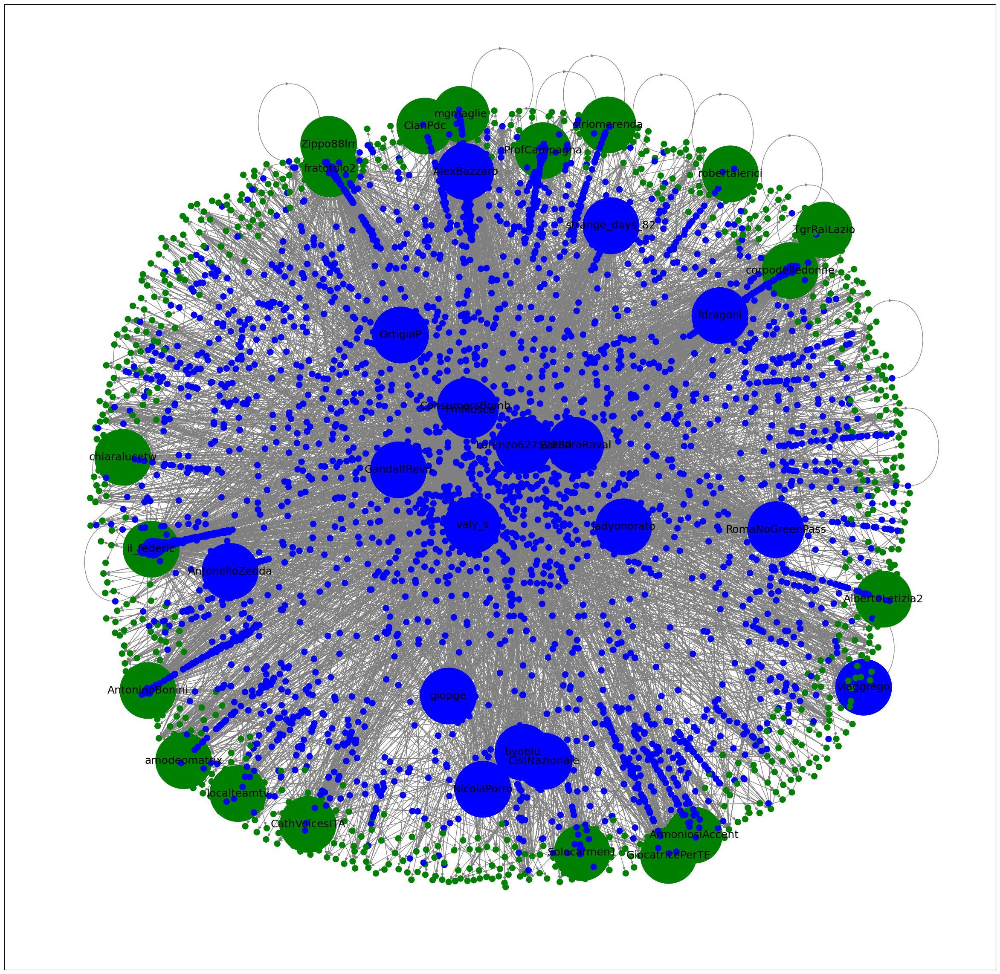

In [ ]:
# Aumento la dimensione del grafo
plt.figure(figsize =(30,30), dpi=100)

# calcolo la posizione dei nodi nel grafo
pos = nx.spring_layout(weight_graph, weight='weight')

# visualizzo il grafo appena costruito
nx.draw_networkx(weight_graph, edge_color='grey', node_size = lst_node_size,
                 labels=dict_node_labels, with_labels = True, font_size=18,
                 node_color = lst_node_color, pos = pos)

Questa visualizzazione ci fa notare che sono molti i nodi colorati in verde, questo può succedere perchè:

* l'utente ha scritto un post in un giorno precedente il 6 Dicembre 2021 ed è stato menzionato o retwittato successivamente.
* l'utente ha si scritto un post il 6 Dicembre 2021 che però non conteneva gli hashtag ricercati. Nonostante questo qualche utente ha retwittato/menzionato il post in questione aggiungendo gli hashtag ricercati. <br>


Inoltre è facile notare come nel grafo nonostante siano stati evidenziati i nodi di maggior influenza, basandosi sull'in_degree come metrica, non sono presenti molti nomi di personaggi noti (politici, cantanti, attori). Si è proceduto quindi con un'analisi manuale dei nomi visualizzati cercando di individuare quelli più famosi, si riporta quindi di seguito una breve descrizione di questi account:
  
*  Corpodelledonne. Account di Lorella Zanardo, attivista e scrittrice italiana femminista.
* fratotolo2. Scrittrice 
* robertalerici. Scrittrice
* ladyonorato. Account di Francesca Donato, membro del parlamento europeo.
* TgrRaiLazio. Account ufficiale della Testata Giornalistica Regionale Rai del Lazio
* AlexBazzaro. Deputato della Lega e consigliere comunale a Venezia.
* chiaralucetw. Account di Carlotta ChiaraLuce, politica.
* amodeomatrix. Account di Francesco Amodeo, giornalista d'inchiesta.
* Byoblu. Account di una TV di libera informazione.
* LocalTeamTv. Account di news.
* NicolaPorro. Account del vicedirettore del ilgiornale.
* CislNazionale

Oltre a questi account è possibile notare il nickname di `GiocatricePerTE`, appartenent e ad un medico chirurgo no-vax, e quello di `RomaNoGreenPass`, appartenente ad un gruppo di studenti universitari contro il green pass.

## Pyvis: visualizzazione interattiva
Dato che la visualizzazione precedente non permette l'interattività nè molta elasticità nei miglioramenti si è deciso di utilizzare una seconda libreria ad hoc, pyvis, che permette di visualizzare il grafo in modo migliore. 

**Nota:** Per rendere ancora più interattiva la visualizzazione è stata aggiunta una funzione javascript che permette, al click su un nodo, di evidenziare i vicini fino all'ordine $2$ dello stesso. Sfortunatamente questo non è automatizzabile in python e quindi la funzione va inserita manualmente sul file html. Le specifiche della funzione si trovano a questo [link.](https://github.com/WestHealth/pyvis/issues/73)

In [ ]:
# Definisco gli attributi richiesti da pyvis per visualizzare opportunamente
# le label dei nodi e le rispettive grandezze
for node in weight_graph:
  # verifico se il nodo ha una in_degree pesata maggiore a 50
  if weight_graph.in_degree(node, weight = 'weight') >= 50:
    weight_graph.nodes[node]['label'] = str(node) # ne visualizzo il nome
    weight_graph.nodes[node]['size'] = 100 # ingrandisco il nodo
    # definisco la forma (cosi la label è visualizzata all'interno del nodo e non sotto)
    weight_graph.nodes[node]['shape'] = 'circle' 
  else:
    # tolgo la label dai nodi con in_degree < 50
    weight_graph.nodes[node]['label'] = ' ' 

  # Aggiungo il titolo a tutti i nodi, in questo modo passandoci il mouse sopra
  # ne verrà visualizzato il rispettivo nome utente twitter
  weight_graph.nodes[node]['title'] = str(node)

In [ ]:
net = Network(height = '1024px', width = "100%", directed=True) # notebook = True -> non va su colab
# setto alcune opzioni extra per  migliorare la visualizzazione
net.set_options("""
var options = {
  "edges": {
    "color": {
      "inherit": true
    },
    "smooth": {
      "type": "continuous",
      "forceDirection": "none",
      "roundness": 0.65
    }
  },
  "physics": {
    "forceAtlas2Based": {
      "springLength": 100
    },
    "minVelocity": 0.75,
    "solver": "forceAtlas2Based"
  },
  "interaction": {
    "navigationButtons": true
  }
}
""")

# populates the nodes and edges data structures
net.from_nx(weight_graph)
net.write_html('base_graph.html') # esporto la pagina html

Non è possibile visualizzare in maniera automatica il grafo direttamente in colab, l'unico modo è scaricare l'html generato da pyvis e aprirlo manualmente. Per questo motivo di seguito è visualizzato uno screenshot del grafo.

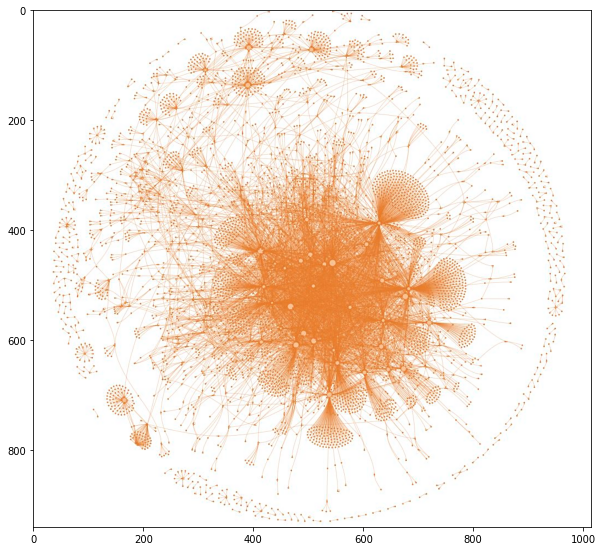

In [ ]:
img = cv.imread(drive_path + 'Pyvis_export/base_graph.JPG')

plt.figure(figsize = (10,10))
plt.imshow(img) 
plt.show()

Dalla visualizzazione è possibile notare che i nodi nel cerchio più esterno sono costituiti da un numero esiguo, a volte anche solo uno, di vicini. Quindi è ragionevole pensare che formeranno delle comunità a sè. Al centro del grafo possiamo invece notare la presenza di alcune strutture circolari che si collegano ad un solo noto, queste saranno le community che vogliamo evidenziare e dato che il nodo alla base è anche più grande degli altri corrispondono esattamente agli hub evidenziati con la metrica dell'in_degree. Infine in alto possiamo notare la presenza di nodi connessi tra loro in maniera meno fitta rispetto al centro, probabilmente questa sarà un'altra comunità a se stante. <br>
In tal senso il layout utilizzato gioca un ruolo fondamentale in questa prima fase di comprensione perchè permette di suddividere già in maniera grossolana e semplice le possibili community!

## Follower analysis
<p align='justify'>
Nella seguente analisi si vuole verificare se il numero di followers gioca un ruolo centrale per far si che un nodo risulti visualizzato nella rete, oppure se al contrario in questa particolare tematica sui vaccini non sia una metrica di popolarità valida.
</p>

In [ ]:
# ordino gli account in base al numero di follower in ordine decrescente
df_sorted = df.sort_values(by = ['author_follower'], ascending=False)
# elimino gli account duplicati (una persona può effettuare più tweet e quindi essere presente più volte)
df_sorted = df_sorted.drop_duplicates(subset = ['author_name'])

print('<------------------ Top 20 seguiti ------------------>')
# visualizzo i top 20 account con maggior numero di followers
df_sorted[['author_name', 'author_follower']].head(25)

<------------------ Top 20 seguiti ------------------>


,author_name,author_follower
8951,sole24ore,1595551
8100,MediasetTgcom24,1198635
1205,RaiNews,1132252
7742,rtl1025,878548
5237,lercionotizie,848316
9380,CorSport,728477
9901,TgLa7,701123
8447,ilgiornale,547311
9279,Adnkronos,542252
4410,La7tv,541627


<p align='justify'>
Si può notare come anche analizzando il numero di follower non sembrano essere presenti nella nostra rete persone note quali politici, attori, cantanti. Inoltre nessuno degli account visualizzato nel grafo risulta essere nella top 20 degli account più seguiti, il primo infatti è posizionato soltanto 40esimo.
</p>

In [ ]:
# non è possibile visualizzare le info sul numero di followers dei nodi 
# in verde, non conosciamo i dati dell'account e quindi il num. followers

print('<----------- Top grafo ------------>')
# estraggo le righe che contengono soltanto utenti visualizzati con la label nel grafo
df_sorted = df_sorted[df_sorted['author_name'].isin(dict_node_labels.values())]

# visualizzo i risultati
df_sorted[['author_name', 'author_follower']].head(25)

<----------- Top grafo ------------>


,author_name,author_follower
7759,NicolaPorro,431457
5506,byoblu,101944
9558,mgmaglie,69536
6095,ProfCampagna,63862
8475,ladyonorato,52726
2790,fdragoni,44052
6907,FmMosca,43781
1816,valy_s,40079
8695,CislNazionale,28858
3873,BarbaraRaval,20745


## SNA metrics
Si analizzano alcune metriche di riferimento per capire meglio la struttura del grafo

In [ ]:
# calcolo dei valori
assortativity = nx.degree_assortativity_coefficient(weight_graph, weight='weight')
node_conn = nx.node_connectivity(weight_graph)
edge_conn = nx.edge_connectivity(weight_graph)
density = nx.density(weight_graph)
overall_reciprocity = nx.overall_reciprocity(weight_graph)
scc = nx.number_strongly_connected_components(weight_graph)
nnodes = weight_graph.number_of_nodes()
deg = sum(d for n, d in weight_graph.degree(weight='weight')) / (2*float(nnodes))

print('Number of nodes:', weight_graph.number_of_nodes())
print('Number of edges:', weight_graph.number_of_edges())
# il diametro non si riesce a computare con networkx mentre gephi riesce ad estrarlo
print('Diameter (extracted from gephi):', 9)
print('Assortativity:', round(assortativity,4))
print('Node connectivity:', node_conn)
print('Edge connectivity:', edge_conn)
print('Graph density:', round(density,6))
print('Overall_reciprocity:', round(overall_reciprocity,5))
print('Number of strongly connected component:', scc)
print('Average degree:', deg)

Number of nodes: 5272
Number of edges: 9681
Diameter (extracted from gephi): 9
Assortativity: -0.1347
Node connectivity: 0
Edge connectivity: 0
Graph density: 0.000348
Overall_reciprocity: 0.00806
Number of strongly connected component: 5229
Average degree: 1.9730652503793626


<p align='justify'>
Il valore di assortativity negativo indica che i singoli hub tendono a connettersi ai nodi più piccoli senza connettersi tra loro. Inoltre il valore di reciprocità indica che gli utenti tendono a retwittarsi poco tra loro, questo influisce anche sulla densità del grafo che risulta essere molto bassa. Infine il valore di connectivity indica che il grafo è disconnesso. 
Tutto questo porta a pensare che la rete sia di tipo ego-centrico dato che sono presenti diversi Hub che vengono retwittati dagli altri utenti, quindi si verifica il fenomeno del 'preferential attachment'. <br>
Si valuta ora la closeness centrality, una misura che riporta la centralità di un nodo nella rete.
</p>

In [ ]:
cc_dict = dict(closeness_centrality(weight_graph))
ordered_cc = dict(sorted(cc_dict.items(), key=lambda item: item[1], reverse = True))

print("\nTop 25 closeness centrality connected component:")
i = 0
for key, value in ordered_cc.items():
  print(key + ': ' + str(value))
  i = i + 1
  if i == 25:
    break


Top 25 closeness centrality connected component:
il_federic: 0.12953341045947292
corpodelledonne: 0.10925654580821147
FmMosca: 0.09921646817483044
RomaNoGreenPass: 0.0841059959747387
mgmaglie: 0.07558529445284437
TgrRaiLazio: 0.07545754365365684
valy_s: 0.07391074541731174
ConsumersBomb: 0.07105540295979398
vale_ria_: 0.06901677637513635
BottaOfficial: 0.0687835509805752
strange_days_82: 0.0669419860968274
AntoninoBonini: 0.0637908244285346
AlexBazzaro: 0.05852670492656836
studentivsgp_Bo: 0.05816416288160637
Zippo88lrr: 0.05555932299172106
myrtamerlino: 0.05428424983736671
Capezzone: 0.05379168622883231
giopge: 0.053453306953591524
fratotolo2: 0.05119005593058748
RobotGufo: 0.049917485092848116
TgLa7: 0.048909758783877336
SkyTG24: 0.04771470341124498
lucatelese: 0.047489178033247814
maxdantoni: 0.04737653678764563
RenatoSouvarine: 0.04737653678764563


Come ci aspettavamo in questa lista sono presenti molti degli hub evidenziati nelle prime analisi. Questo perchè i nodi risultano essere vicini a molti altri nodi della rete. <br>
Valutiamo ora la betweenness centrality che riporta l'importanza di un nodo nelle comunicazioni con altri nodi (i.e. quanto un nodo è di passaggio).

In [ ]:
bcGC_dict = dict(betweenness_centrality(weight_graph, weight='weight'))
ordered_bcGC = dict(sorted(bcGC_dict.items(), key=lambda item: item[1], reverse = True))

print("\nTop 25 betweenness centrality connected component:")
i = 0
for key, value in ordered_bcGC.items():
  print(key + ': ' + str(value))
  i = i + 1
  if i == 25:
    break


Top 25 betweenness centrality connected component:
valy_s: 0.001413354443435259
lucabattanta: 0.0007633716211927074
ladyonorato: 0.0003272983785468948
metaanto: 0.0002875915392074664
giopge: 0.0002475235049681099
FmMosca: 0.00016356369048069043
OrtigiaP: 0.00012264726822057274
BarbaraRaval: 0.00010791267627301107
DeodatoRibeira: 0.00010310074421749164
Preppy696: 9.816761387329211e-05
EnzoCare2: 4.691333758367332e-05
igsolkr: 4.4027378333417936e-05
soniabetz1: 4.2584398708290244e-05
RisatoNicola: 4.0130433358280986e-05
RomaNoGreenPass: 3.7286473514993974e-05
Miniver841: 3.512050409848192e-05
actarus1070: 3.063556742578795e-05
strange_days_82: 3.063556742578794e-05
1nove71: 2.826320092360296e-05
Satirev4: 2.8199601821622277e-05
AntonelloZedda: 2.6711622831885617e-05
TgLa7: 2.516364468933699e-05
FitCisl: 2.213968738761409e-05
ZombieBuster5: 2.1543895800191305e-05
manuelaiati: 2.0726707338892405e-05


In questo caso notiamo che molti dei nodi con betweenness più alta non sono degli hub, come ci potevamo aspettare per via del valore di assortativity del grafo. Tuttavia nelle prime 5 posizioni possiamo trovare `valy_s` e `ladyonorato` che sono anche degli hub, questo è dovuto al fatto che entrambe sono molto attive su twitter ed effettuano un gran numero di post (originali o retwitting) ogni giorno!

### Ulteriori analisi
Per capire meglio i risultati emersi dalle metriche del grafo si producono dei grafici per rappresentare il numero di retweet medi, fatti e ricevuti da ogni utente, nell'arco della giornata.

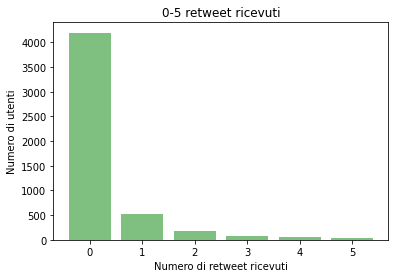

In [16]:
#produciamo un barchart per valutare quanti utenti hanno ricevuto pochi retweets, pari ad un numero minore di 5
objects = ('0','1','2','3','4','5')
degrees = sorted([weight_graph.in_degree(n) for n in weight_graph.nodes()])

uno=0
due=0
tre=0
qua=0
cin=0
zer=0
for el in degrees:
    if el == 0:
        zer+=1
    if el == 1:
        uno+=1
    if el == 2:
        due+=1
    if el == 3:
        tre+=1
    if el == 4:
        qua+=1
    if el == 5:
        cin+=1
        
performance=[]
performance.append(zer)
performance.append(uno)
performance.append(due)
performance.append(tre)
performance.append(qua)
performance.append(cin)

# per settare i ticks dell'asse x
y_pos = np.arange(len(objects))
 
# visualizzo il grafo
plt.bar(y_pos, performance, align='center', alpha=0.5, color='green')
plt.xticks(y_pos, objects)
plt.ylabel('Numero di utenti')
plt.xlabel('Numero di retweet ricevuti')
plt.title('0-5 retweet ricevuti')
plt.show()

Questo grafo ci dice che molti utenti ricevono $0$ retweet questo trova conferma, e conferma a sua volta, il fatto che il grafo sia disconnesso e poco denso. <br>
Analizzando il grafo opposto, ovvero il numero di retweet effettuati, si ottiene la medesima conferma dato che la maggior parte degli utenti ha effettuato un solo retweet nell'arco di tutta la giornata. Gli utenti sembrano essere poco interessanti a discutere e commentare l'argomento, piuttosto si concentrano sul postare (o retwittare) il pensiero con cui si trovano maggiormente d'accordo. Questo rende la rete disconessa e poco densa.

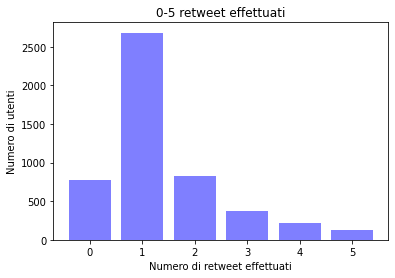

In [17]:
#produciamo un barchart per valutare quanti utenti hanno ricevuto pochi retweets, pari ad un numero minore di 5
objects = ('0','1','2','3','4','5')
degrees = sorted([weight_graph.out_degree(n) for n in weight_graph.nodes()])

uno=0
due=0
tre=0
qua=0
cin=0
zer=0
for el in degrees:
    if el == 0:
        zer+=1
    if el == 1:
        uno+=1
    if el == 2:
        due+=1
    if el == 3:
        tre+=1
    if el == 4:
        qua+=1
    if el == 5:
        cin+=1
        
performance=[]
performance.append(zer)
performance.append(uno)
performance.append(due)
performance.append(tre)
performance.append(qua)
performance.append(cin)

# per settare i ticks dell'asse x
y_pos = np.arange(len(objects))
 
# visualizzo il grafo
plt.bar(y_pos, performance, align='center', alpha=0.5, color='blue')
plt.xticks(y_pos, objects)
plt.ylabel('Numero di utenti')
plt.xlabel('Numero di retweet effettuati')
plt.title('0-5 retweet effettuati')
plt.show()

#si evince che la maggior parte degli utenti hanno effettuato un solo retweet

Proviamo ora ad estendere il range dei retweet ricevuti per capire se la scelta di utilizzare il valore di soglia $50$ per evidenziare i nodi importanti è valida.

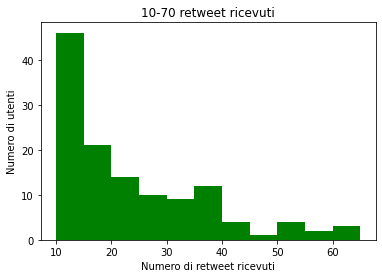

In [18]:
def plot_degree_dist(G):
    bins=np.arange(10,70,5)  
    degrees = sorted([G.in_degree(n) for n in G.nodes()])
    plt.hist(degrees, bins, color='green')
    plt.ylabel('Numero di utenti')
    plt.xlabel('Numero di retweet ricevuti')
    plt.title('10-70 retweet ricevuti')
    plt.show()

plot_degree_dist(weight_graph)

Da questa ultimo grafico, anche se ristretto fino al massimo di $70$, si nota come dopo la soglia di $40$ ci sia un salto. Questo conferma la scelta iniziale di utilizzare come valore $50$ per evidenziare i nodi più importanti.

## Community Detection
I social (come Twitter) hanno consentito alle persone di tutto il mondo di interagire tra loro e costruire relazioni con altri individui con cui condividono interessi comuni. Questo può essere osservato nella vita reale: naturalmente, tendiamo a sviluppare e mantenere relazioni con altri simili a noi. Le persone con interessi simili tendono a gravitare l'una verso l'altra e ad associarsi in comunità, gruppi o gruppi di persone che condividono tratti simili tra loro. Poiché le persone tendono a raggrupparsi con altre simili a loro, possiamo utilizzare il rilevamento della comunità per identificare gli utenti con un numero elevato di gradi (connessioni) e vedere fino a che punto può viaggiare la loro portata nella rete.

### Network-centric: modularity maximization
Il concetto di modularità è fondamentale per il rilevamento delle comunità.
Dato un gruppo, la modularità Q del gruppo è la differenza tra il numero di archi effettivi all'interno del gruppo e il numero previsto di archi all'interno del gruppo. Questo valore viene poi normalizzato per restituire un valore compreso tra $[-1, 1]$.
Quanto più positivo è il valore di Q tanto più significativo è il
raggruppamento, l'intero grafico (come una comunità) ha Q = 0. <br>
Il numero previsto di archi all'interno di un gruppo è calcolato sulla base dell'ipotesi nulla che gli archi siano formati casualmente, cioè non esista alcuna struttura.

In [ ]:
# estraggo le community utilizzando l'algoritmo di modularity maximization
comm = list(greedy_modularity_communities(weight_graph, weight='weight'))

# visualizzo alcune informazioni di base
print('Numero di community individuate:', len(comm))
print('Modularity score:', nx_comm.modularity(weight_graph, comm, weight='weight'))

Numero di community individuate: 204
Modularity score: 0.6323168185196233


Sono state individuate un gran numero di community, tuttavia lo score medio complessivo rimane piuttosto alto pari a $0.63$.

In [ ]:
# creo una nuova colonna nel dataframe per rappresentare il cluster
df['cluster'] = -1

c_index = -1
# itero su ogni community trovata
for c in comm:
  c_index = c_index + 1
  # per ogni autore (nodo del grafo) presente nella community salvo il corrispettivo numero di cluster
  for name in list(c):
    df.loc[df['author_name'] == name, 'cluster'] = c_index

Il cluster -1 contiene nodi 'soli', hanno scritto un post il 6 Dicembre che però non è stato retwittato da nessuno e loro non hanno retwittato nessuno. Quindi li escludiamo dal grafo

In [ ]:
# elimino le righe con cluster = -1
df = df[df.cluster != -1]

# visualizzo alcuni hub in che cluster sono assegnati
temp = df[df['author_name'].isin(dict_node_labels.values())]
temp = temp.drop_duplicates('author_name')
temp[['author_name','cluster']].sort_values(by='cluster')[:10]

,author_name,cluster
50,valy_s,0
789,giopge,0
8804,RomaNoGreenPass,0
1897,viaggrego,0
7463,Zippo88lrr,0
9181,CianPdc,1
7526,siriomerenda,1
6095,ProfCampagna,1
3274,FmMosca,3
3861,BarbaraRaval,3


In [ ]:
# estraggo i cluster che contengono degli hub in base all'autore del post
lst_cluster_hub = df[df['author_name'].isin(dict_node_labels.values())]['cluster'].unique()

temp_lst = []
# estraggo cluster che contengono hub in base alla menzione (nodi verdi iniziali)
for _, row in df.iterrows():
  # per ogni nome menzionato o retwittato verifico se corrisponde ad un hub
  for name in row['rt_names']:
    # se è un hub salvo il numero di cluster
    if name in dict_node_labels.values():
      temp_lst.append(row['cluster'])

# unisco le due liste ed estraggo i valori unici
lst_cluster_hub = set(np.append(lst_cluster_hub, temp_lst))

### Visualizzazione community
Avendo estratto diverse community si vuole visualizzare graficamente il risultato, in questo caso verrà utilizzata direttamente la versione interattiva che sfrutta la libreria pyvis. Come in precedenza è stata poi aggiunta al file .html una funzione javascript che permette di evidenziare il vicinato di un nodo selezionato, questo appunto è stato fatto solo in un secondo momento sul file scaricato.

In [ ]:
# aggiungo ai nodi il riferimento alla community di appartenenza
# in automatico pyvis assegna un colore per ogni community
def set_node_community(G, communities):
  '''Add community to node attributes'''
  for c, v_c in enumerate(communities):
    if len(v_c) > 20: # coloro solo i cluster con piu di 20 utenti
      for v in v_c:
        # Add 1 to save 0 for external edges
        G.nodes[v]['group'] = c + 1


set_node_community(weight_graph, comm)

In [ ]:
net = Network(height = '1024px', width = "100%", directed=True) # notebook = True -> non va su colab
# setto alcune opzioni extra per  migliorare la visualizzazione
net.set_options("""
var options = {
  "edges": {
    "color": {
      "inherit": true
    },
    "smooth": {
      "type": "continuous",
      "forceDirection": "none",
      "roundness": 0.65
    }
  },
  "physics": {
    "forceAtlas2Based": {
      "springLength": 100
    },
    "minVelocity": 0.75,
    "solver": "forceAtlas2Based"
  },
  "interaction": {
    "navigationButtons": true
  }
}
""")

# populates the nodes and edges data structures
net.from_nx(weight_graph)
net.write_html('community.html')

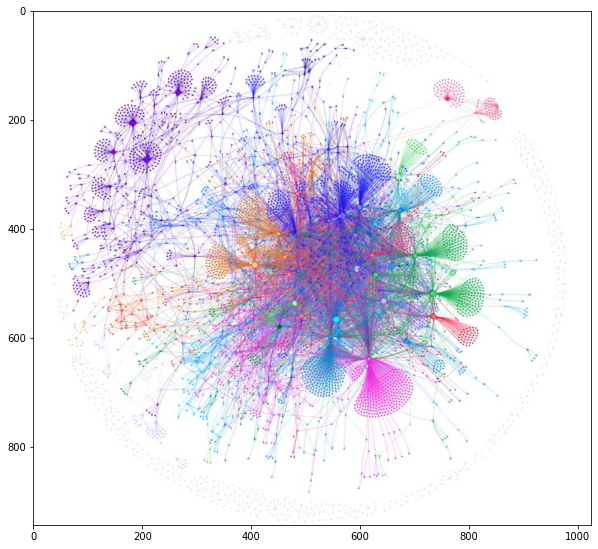

In [ ]:
img = cv.imread(drive_path + 'Pyvis_export/community.JPG')

plt.figure(figsize = (10,10))
plt.imshow(img) 
plt.show()

Dalla visualizzazione è possibile notare che molti cluster fanno riferimento agli hub evidenziati in fase iniziale, come ci aspettavamo. Alcuni hub, come `CislNazionale` riportato in alto in viola, creano delle community quasi completamente isolate dal resto della rete. Mentre molti hub tendono a creare si community ma condivise con almeno un altro hub come accade nella parte centrale del grafo. 

### Semantic cluster analysis
Analizzare i cluster graficamente risulta appunto abbastanza complesso, si vuole quindi provare ad approcciare la problematica analizzando gli argomenti trattati dai diversi cluster attraverso delle wordcloud per capire se vi sono differenze significative nei contenuti delle diverse community. 
Nella creazione delle wordcloud si è deciso di eliminare le stopwords dai testi per migliorare la visualizzazione ed evitare di stampare parole poco significative come gli articoli. Questo si è reso necessario in quanto le stopwords non sono state preprocessate per ragioni legate alla sentiment analysis.

In [ ]:
def display_cluster_wordcloud(data, n_cluster, stopwords, ncols = 4):
  # get number of rows
  nrows = math.ceil(n_cluster/ncols)

  fig = plt.figure(figsize =(25,50))
  plt.subplots_adjust(left=0.125, bottom=0.1, right=0.9, top=0.4, wspace=0.2, hspace=0.1)

  i = 0
  # plot wordcloud for each cluster
  for cl in data.groupby('cluster'):
    # nuovo subplot
    plt.subplot(nrows, ncols, 1+i)

    # estraggo tutti i testi
    text = " ".join(t for t in cl[1]['text_clean'])

    # Generate a word cloud image
    wordcloud = WordCloud(stopwords = stopwords, background_color="white").generate(text)

    # Visualizzo la wordcloud
    plt.imshow(wordcloud, interpolation='bilinear')
    tit = 'Wordcloud of cluster: ' + str(cl[0])
    plt.title(tit)
    plt.axis("off")

    i = i +1

In [ ]:
it_stopwords = stopwords.words('italian') # scaricamento delle stopwords italiane
# aggiungo delle parole per evitare che finiscano nei cluster
it_stopwords.append("l'")
it_stopwords.append("dell'")
it_stopwords.append("com'")
it_stopwords.append("oggi") # parola molto presente ma poco significativa

#### Wordcloud cluster con più di 20 utenti
Visualizziamo le wordcloud dei cluster che raggruppano più di 20 utenti (nodi) diversi.

In [ ]:
# estraggo i cluster con più di 20 utenti
cluster_over20 = df.groupby(by='cluster').count().query("text > 20").index
# calcolo il numero di cluster che vanno visualizzati
n_cluster = len(cluster_over20)

# estraggo gli indici del dataframe che contengono nodi appartenenti ai cluster estratti
idx_over20 = df[df['cluster'].isin(cluster_over20)].index

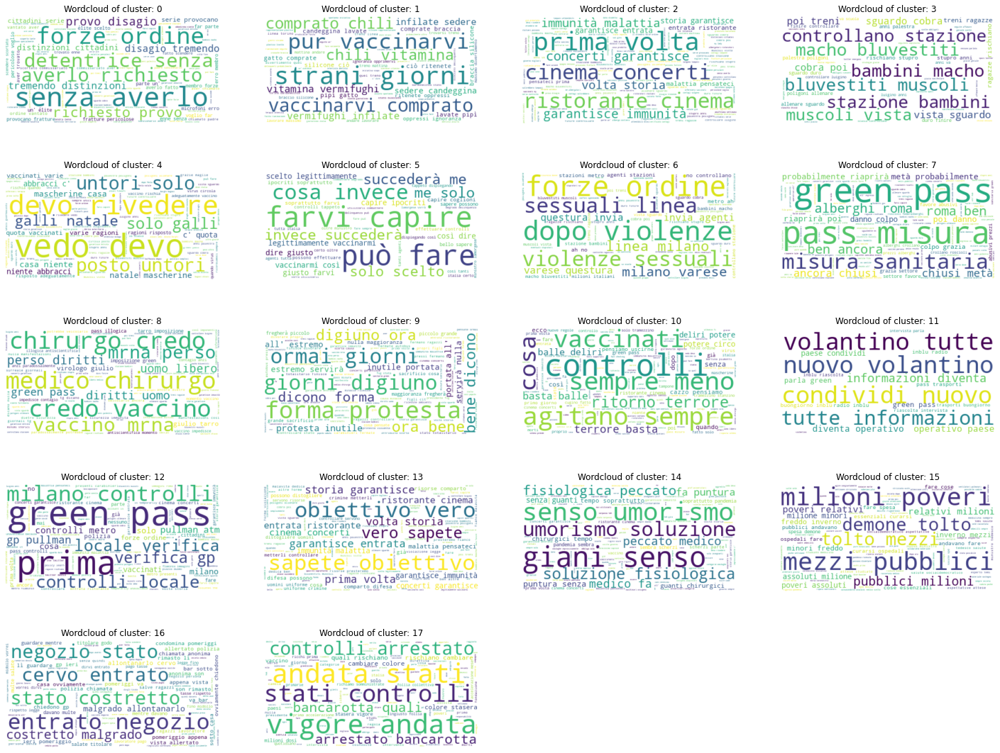

In [ ]:
# wordcloud dei cluster con più di 20 utenti
display_cluster_wordcloud(df.loc[idx_over20, ['text_clean', 'cluster']], 
                          n_cluster, stopwords = it_stopwords, ncols = 4)

Da questa visualizzazione è possibile notare che le tematiche variano leggermente di cluster in cluster anche se ci sono diversi aspetti comuni, com'era logico pensare. E' possibile però identificare dei cluster precisi, ad esempio l'$11$ si riferisce all'account `CislNazionale`, oppure l'$8$ è chiaramente la community del medico chirurgo novax.

#### Wordcloud cluster contenenti un hub
Visualizziamo le wordcloud dei cluster che contengono uno dei nodi evidenziati precedentemente nel grafo.

In [ ]:
# estraggo gli indici delle righe che contengono un tweet di un utente rivelatosi hub
idx_hub = df[df['cluster'].isin(lst_cluster_hub)].index.values

n_cluster = len(lst_cluster_hub)

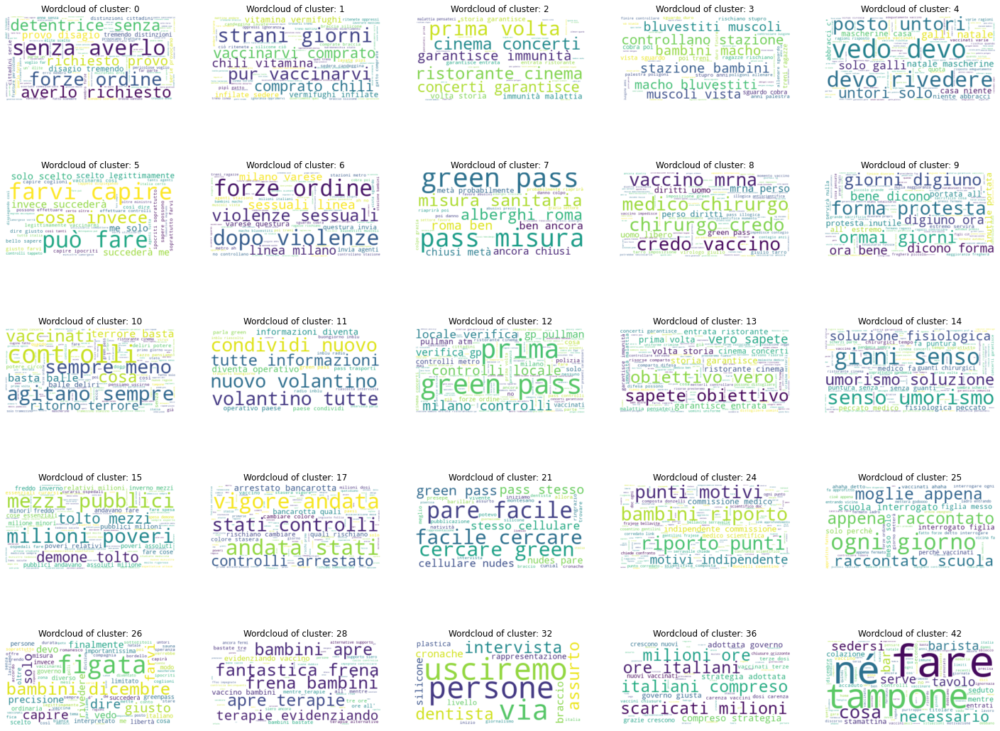

In [ ]:
# wordcloud dei cluster con più di 20 utenti
display_cluster_wordcloud(df.loc[idx_hub, ['text_clean', 'cluster']], 
                          n_cluster, stopwords = it_stopwords, ncols = 5)

Possiamo notare che i cluster che contengono gli hub contengono gli stessi cluster di prima più alcuni ulteriori. Nei nuovi cluster aggiunti si evidenzia la presenza della tematica del vaccino sui bambini (cluster $26$ e $28$) che prima non era presente ma anche il cluster $36$ che riguarda il numero di green pass scaricati ed è un cluster positivo (provax)!

#### Wordcloud cluster minori
Visualizziamo infine le wordcloud dei cluster più piccoli che contengono da 2 a 4 utenti.

In [ ]:
# estraggo i cluster con un numero di utenti compreso tra 2 e 5
cluster_under5 = df.groupby(by='cluster').count().query("text < 4 and text > 2").index
# calcolo il numero di cluster che vanno visualizzati
n_cluster = len(cluster_under5)

# estraggo gli indici del dataframe che contengono nodi appartenenti ai cluster estratti
idx_under5 = df[df['cluster'].isin(cluster_under5)].index

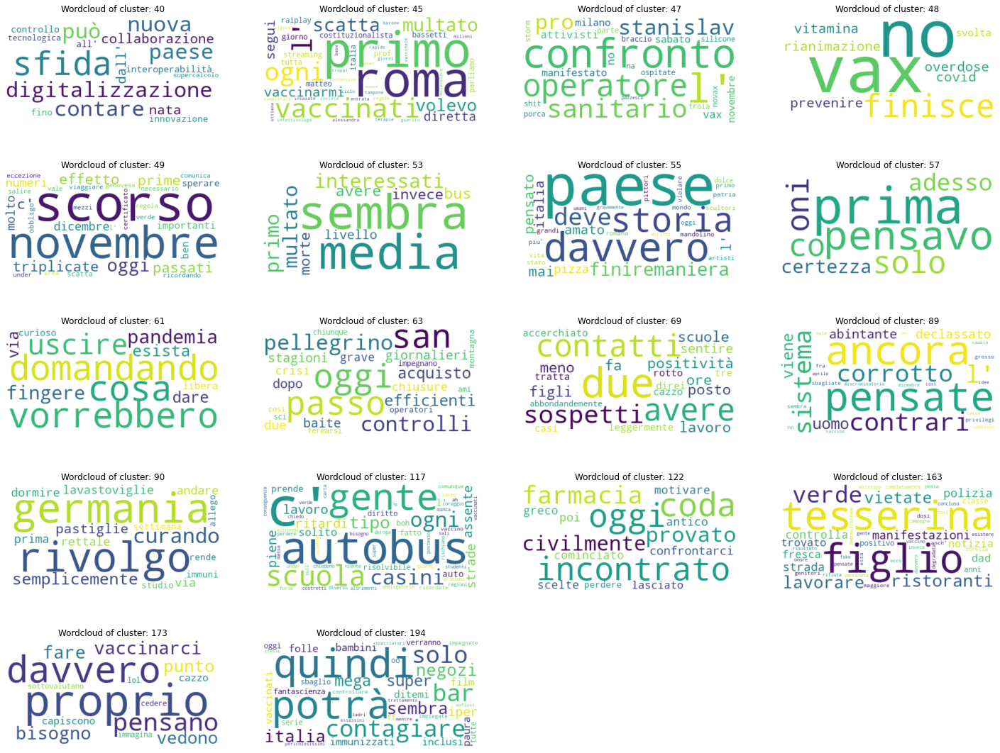

In [ ]:
# wordcloud dei cluster con meno di 5 utenti
display_cluster_wordcloud(df.loc[idx_under5, ['text_clean', 'cluster']], n_cluster,
                          stopwords = it_stopwords, ncols = 4)

Anche nei cluster minori la prevalenza sembra comunque contenere post di utenti no-vax o comunque contro l'uso esteso del greenpass. Anche se in alcuni casi vi sono dei commenti a favore di queste nuove norme.


In [ ]:
for _, row in df[df['cluster'] == 194].iterrows():
  print(row['text'])

Quindi ci si potrà contagiare solo nei bar e nei negozi. 
#supergreenpass 
#VarianteOmicron 
#contagi
Sembra che, in Italia,  un 85% di super mega iper immunizzati, abbia una paura folle di un 15% (inclusi i bambini...) di non vaccinati.
Ditemi che è un film di fantascienza di serie B.
#immunizzati #greenpass #vaccino #novax
Sbaglio o, da oggi, tutte le FF.OO. verranno impiegate ed impegnate per controllare i pericolosissimi #nonGreenPassisti, mentre mafiosi, spacciatori, ladri, assassini non avranno lo stesso trattamento?
#supergreenpass


### Community pro-vax
All'interno delle diverse community si è notata una presenza minoritaria di pro-vax. Se ne riportano alcuni esempi di seguito.

In [ ]:
for _, row in df[df['cluster'] == 61].iterrows():
  print(row['text'])

Mi stavo domandando, ma tutti quelli #novax, cosa vorrebbero che si facesse per uscire da questa pandemia? Fingere che non esista e dare il via libera a tutti? Sono curioso
Mi stavo domandando, ma tutti quelli #novax, cosa vorrebbero che si facesse per uscire da questa pandemia? Fingere che non esista e dare il via libera a tutti? Sono curioso
Mi stavo domandando, ma tutti quelli #novax, cosa vorrebbero che si facesse per uscire da questa pandemia? Fingere che non esista e dare il via libera a tutti? Sono curioso


In [ ]:
for _, row in df[df['cluster'] == 190].iterrows():
  print(row['text'])

I #novax hanno questo di notevole: fanno cadere le braccia anche senza frequentarli, solo per sentito dire.


In [ ]:
for _, row in df[df['cluster'] == 122].iterrows():
  print(row['text'])

Oggi ho incontrato un #novax in coda in farmacia. Abbiamo provato civilmente a confrontarci. Poi lui ha cominciato a motivare le sue scelte in greco antico. Ho lasciato perdere. #COVID19 #vaccino #novax https://t.co/g9yhP1b5Fd
Oggi ho incontrato un #novax in coda in farmacia. Abbiamo provato civilmente a confrontarci. Poi lui ha cominciato a motivare le sue scelte in greco antico. Ho lasciato perdere. #COVID19 #vaccino #novax https://t.co/g9yhP1b5Fd
Oggi ho incontrato un #novax in coda in farmacia. Abbiamo provato civilmente a confrontarci. Poi lui ha cominciato a motivare le sue scelte in greco antico. Ho lasciato perdere. #COVID19 #vaccino #novax https://t.co/g9yhP1b5Fd


In [ ]:
for _, row in df[df['cluster'] == 98].iterrows():
  print(row['text'])

@twinky33 Chiedi abolizione del #greenpass e avrai la farmacia di nuovo senza code e tutta per te
#GreenPassRafforzato non ne posso più di chi rifiuta il vaccino: andare in farmacia è diventato impossibile. Code per chi ha diritto a curarsi a causa di chi se ne frega degli altri. Per non parlare degli ospedali.


# Sentiment Analysis
Lo scopo di questa sezione è quello di analizzare i tweet contenuti nei cluster individuati nella sezione precedente dal punto di vista della sentiment e della emotion recognition analysis.
Trattasi di un modo per valutare i cluster così ottenuti dal punto di vista del contenuto anziché dal punto di vista della struttura del grafo.

## [SentITA](https://nicgian.github.io/Sentita/)
https://github.com/NicGian/SentITA

SentITA restituisce gli score sia per la polarità positiva sia quella negativa

In [ ]:
''' 
funzione che dato i valori di polarità positiva e negativa ritorna un valore sintesi 
reference: http://valeriobasile.github.io/twita/sentix.html 
'''

def sentiment_polarity(pos_neg_score):
  theta = np.arctan(pos_neg_score[0] / pos_neg_score[1])
  intensity = np.sqrt(np.sum(np.square(pos_neg_score)))
  polarity = 1-(4*theta/np.pi)
  return intensity * polarity

# applica la funzione di SentITA e torna i valori di polarità negativa e positiva
def sentiment_sentence_statita(sentence):
  results, polarities = calculate_polarity([sentence])
  return [polarities[0][1], polarities[0][0]]

### Si potrebbe mettere come esempio di comportamente di sentITA nel report?

In [ ]:
df.loc[9970]["text_clean"]

'.. polizza per danni collaterali da proposta in azienda. miocardite, infarto, paresi, ictus, neoplasia maligna... ma come? non era sicuro?? alla faccia dei complottisti!! '

In [ ]:
calculate_polarity([".. polizza per danni collaterali da proposta in azienda. miocardite, infarto, paresi, ictus, neoplasia maligna... ma come? non era sicuro?? alla faccia dei complottisti!! "])

.. polizza per danni collaterali da proposta in azienda. miocardite, infarto, paresi, ictus, neoplasia maligna... ma come? non era sicuro?? alla faccia dei complottisti!!   - opos:  0.07428093  - oneg:  0.7348389


(['.. polizza per danni collaterali da proposta in azienda. miocardite, infarto, paresi, ictus, neoplasia maligna... ma come? non era sicuro?? alla faccia dei complottisti!!  - opos: 0.07428093 - oneg: 0.7348389'],
 array([[0.07428093, 0.7348389 ]], dtype=float32))

## Sentiment polarity
La procedura è stata implementata con un sistema di checkpoint che ogni #chunk_size tweet memorizza i risultati su file.  
Questo è stato necessario per via dell'utilizzo di Google Colab che limita l'uso non interattivo.

In [ ]:
authors_clustered = df.copy(deep = True)
authors_clustered.head()

,id,text,text_clean,author_name,rt_names,author_follower,author_friends,cluster
0,1468007234865188870,Dissonanza cognitiva.\nUno studente per entrar...,dissonanza cognitiva. uno studente per entrare...,PubblicoDebito,[ArmoniosiAccent],133,292,7
1,1468007186412584964,A quelli che parlano di sparute minoranze rico...,a quelli che parlano di sparute minoranze rico...,GiuliettaVanni,[Ma_Messina],1923,1990,2
2,1468007186383224838,@giusbrindisi qualcuno ti ha cagato in bocca.\...,qualcuno ti ha cagato in bocca. l’ apice di qu...,unfruitfruitful,[giusbrindisi],76,10,2
3,1468007141659271169,Controllano il #GreenPass in stazione ai bambi...,controllano il in stazione ai bambini i macho ...,VedeleAngela,[FmMosca],963,691,6
4,1468007118737494016,Io medico chirurgo che non\ncredo in questo va...,io medico chirurgo che non credo in questo vac...,Trovolavorobiz,[GiocatricePerTE],3139,780,8


In [ ]:
# cartella drive per salvare il file
os.chdir(drive_path + "DATA")
chunk_size = 100
a = pd.Series()

# per ogni tweet ne viene calcolata sentiment e polarity
for start, end in [(i, i+(chunk_size-1)) for i in list(range(0,10_000,chunk_size))]:
  # print( "\n", start, end)

  # calcolo della sentiment e polarity 
  a = authors_clustered.loc[start:end]["text_clean"]\
                                    .apply(sentiment_sentence_statita)\
                                    .apply(sentiment_polarity)

  # ogni tot iterazioni viene salvato il file con le sentiment calcolate
  # in quanto la computazione è lunga e potrebbe bloccarsi (cosi si evita di ripartire da 0)
  if start == 0:
    print("sto salvando x la prima volta...")
    a.to_csv("text_sentiment.csv", index = False)
  else:
    print("sto salvando...")
    b = pd.read_csv("text_sentiment.csv", squeeze = True)
    b = b.append(a, ignore_index=True) # aggiungo le nuove sentiment calcolate
    b.to_csv("text_sentiment.csv", index = False) # aggiorno il file salvato

## Se non si vuole rieseguire la procedura, è possibile caricare il file text_sentiment.csv

In [ ]:
sentiment_polarity_ = pd.read_csv(drive_path + "DATA/text_sentiment.csv", squeeze = True)
sentiment_polarity_.shape

(9999,)

In [ ]:
# aggiungo nel dataframe una colonna relativa alla sentiment e alla polarity
authors_clustered["sentiment_polarity"] = sentiment_polarity_
# salvo il file con tutte le info
# authors_clustered.to_csv(drive_path + "DATA/autore_cluster_sentiment.csv", index = False)

### Sentiment come variabile qualitativa ordinale


*   < -0.5  $\rightarrow$ negative 
*   \> +0.5  $\rightarrow$ positive
*   altrimenti $\rightarrow$ neutral



In [ ]:
# conversione della sentiment in negativo/positivo/neutro in base allo score
authors_clustered["sentiment_label"] = authors_clustered["sentiment_polarity"].apply(lambda x : "negative" if x < -0.5 else "positive" if x > 0.5 else "neutral")

# visualizzo le prime 10 righe del dataframe
authors_clustered[["id", "text_clean", "cluster", "sentiment_polarity","sentiment_label"]].head(10)

,id,text_clean,cluster,sentiment_polarity,sentiment_label
0,1468007234865188870,dissonanza cognitiva. uno studente per entrare...,7,-0.003247,neutral
1,1468007186412584964,a quelli che parlano di sparute minoranze rico...,2,-0.000177,neutral
2,1468007186383224838,qualcuno ti ha cagato in bocca. l’ apice di qu...,2,-0.058742,neutral
3,1468007141659271169,controllano il in stazione ai bambini i macho ...,6,-0.019421,neutral
4,1468007118737494016,io medico chirurgo che non credo in questo vac...,8,-0.141191,neutral
5,1468007105273778179,sono ormai 5 giorni che digiuno contro il per ...,9,-0.319566,neutral
6,1468007088278409217,dissonanza cognitiva. uno studente per entrare...,0,-0.003247,neutral
7,1468007083480170509,cosa che invece succederà a me da oggi solo pe...,0,-0.496550,neutral
8,1468007033047814149,"tardi per queste categorie lamentarsi, dal pri...",4,-0.001049,neutral
9,1468007009303896064,è la prima volta nella storia che un ti garant...,4,-0.139040,neutral


### Aggregazione per cluster di appartenenza
Si calcola la distribuzione di tweet positivi, negativi e neutri per ciascun cluster

In [ ]:
polarity_intra_cluster = authors_clustered.groupby(["cluster","sentiment_label"]).count()["id"].unstack(fill_value=0)
# polarity_intra_cluster.drop(index = -1, inplace = True) # elimino cluster -1 (nodi isolati, già eliminati sopra)

In [ ]:
polarity_intra_cluster.head()

sentiment_label,negative,neutral,positive
cluster,,,
0,284,1111,16
1,135,610,29
2,114,840,31
3,56,871,13
4,51,761,82


## Emotion recognition
Per poter utilizzare la libreria [NRCLex](https://github.com/metalcorebear/NRCLex) con testi in italiano è stato necessario costruire il dizionario che associa alle parole le rispettive emozioni.  
A questo scopo è stata implementata la funzione *create_nrc_ita* all'interno del file *NRC_emotion.py* che prende in input l'NRC-Emotion-Lexicon e lo adatta al formato richiesto da NRCLex

In [ ]:
os.chdir(drive_path) # mi posiziono nella cartella principale
import NRC_emotion #Libreria disponibile in locale come file .py

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:
emotion_analyzer = NRC_emotion.NRCLex(lexicon_file=drive_path + 'NRC Lexicon/nrc_it.json') #Caricamento del dizionario italiano

In [ ]:
emotion_analyzer.load_raw_text("ciao che bella giornata")
list_emotions_names = list(emotion_analyzer.affect_frequencies.keys())
list_emotions_names #Prendo tutte le emozioni possibili, mi serviranno per costruire il dataframe

['fear',
 'anger',
 'anticipation',
 'trust',
 'surprise',
 'positive',
 'negative',
 'sadness',
 'disgust',
 'joy']

In [ ]:
'''
Funzione per estrarre le emozioni contenute in ciascuna frase
Di default NRCLex attraverso il metodo load_raw_text() distribuisce il peso totale equamente a ciascuna emozione presente.
es. se le emozioni presenti nella frase sono:
  -fear, anger e disgust, ciascuna avrà peso 0.33
  -fear e anger, ciascuna avrà 0.5

La nostra analisi si limita invece a constatare la presenza o meno dell'emozione nel testo, senza preoccuparsi di andare a misurare 
l'intensità, il che richiederebbe approcci più sofisticati di NLP rispetto alla semplice divisone 1/#numero_emozioni
'''

def emotion_extraction(sentence):
  emotion_analyzer.load_raw_text(sentence)
  return np.array([1 if value > 0 else 0 for key, value in emotion_analyzer.affect_frequencies.items()])

In [ ]:
authors_clustered["emotions"] = authors_clustered["text_clean"].apply(emotion_extraction)

### Aggregazione per cluster di appartenenza

In [ ]:
# conto il numero di emozioni per ogni cluster
emotion_intra_cluster = pd.DataFrame(authors_clustered.groupby("cluster")["emotions"].apply(np.sum))
emotion_intra_cluster = emotion_intra_cluster.pop("emotions").apply(pd.Series).set_axis(list_emotions_names, axis=1) #da una sola colonna che contiene il vettore dei conteggi delle emozioni si passa a un df con una colonna per ciascuna emozione
emotion_intra_cluster.drop(columns = ["positive", "negative"], inplace = True) #elimina positive e negative in quanto realativi alla sentiment, già calcolata con sentITA

In [ ]:
emotion_intra_cluster

,fear,anger,anticipation,trust,surprise,sadness,disgust,joy
cluster,,,,,,,,
0,388,268,541,660,305,417,189,407
1,171,194,274,275,166,147,82,191
2,581,526,167,256,72,516,474,108
3,559,472,382,460,103,419,358,364
4,219,175,206,264,94,168,110,186
...,...,...,...,...,...,...,...,...
199,2,2,0,2,0,0,2,0
200,0,1,0,1,1,0,0,0
201,0,0,1,1,0,0,0,1


## Sentiment + Emotion

In [ ]:
df_cluster = polarity_intra_cluster.join(emotion_intra_cluster, how = "right")
# df_cluster.drop(index = -1, inplace = True) # elimino il cluster -1 (già fatto)
df_cluster["cluster_size"] = authors_clustered.groupby("cluster").size() #Numero di tweet per ciascun cluster

## Normalization
Trattandosi di dati assoluti, essi vengono aggiustati per la numerosità del cluster, in modo da poter comparare i cluster indipendentmente dalla loro dimensione.  
Osservando la numerosità degli stessi, è stato deciso di analizzare soltanto i cluster con almeno 20 tweet al proprio interno, ovvero i primi 18.

In [ ]:
df_cluster["positive"] = df_cluster["positive"] / df_cluster["cluster_size"] *100
df_cluster["neutral"] = df_cluster["neutral"] / df_cluster["cluster_size"] *100
df_cluster["negative"] = df_cluster["negative"] / df_cluster["cluster_size"] *100

df_cluster["fear"] = df_cluster["fear"] / df_cluster["cluster_size"] *100
df_cluster["anger"] = df_cluster["anger"] / df_cluster["cluster_size"] *100
df_cluster["anticipation"] = df_cluster["anticipation"] / df_cluster["cluster_size"] *100
df_cluster["trust"] = df_cluster["trust"] / df_cluster["cluster_size"] *100
df_cluster["surprise"] = df_cluster["surprise"] / df_cluster["cluster_size"] *100
df_cluster["sadness"] = df_cluster["sadness"] / df_cluster["cluster_size"] *100
df_cluster["disgust"] = df_cluster["disgust"] / df_cluster["cluster_size"] *100
df_cluster["joy"] = df_cluster["joy"] / df_cluster["cluster_size"] *100


df_cluster = df_cluster.round().astype("int")
df_cluster.head(20)

,negative,neutral,positive,fear,anger,anticipation,trust,surprise,sadness,disgust,joy,cluster_size
cluster,,,,,,,,,,,,
0,20,79,1,27,19,38,47,22,30,13,29,1411
1,17,79,4,22,25,35,36,21,19,11,25,774
2,12,85,3,59,53,17,26,7,52,48,11,985
3,6,93,1,59,50,41,49,11,45,38,39,940
4,6,85,9,24,20,23,30,11,19,12,21,894
5,3,97,0,49,40,38,47,30,40,13,36,667
6,10,88,2,35,29,19,39,17,26,18,20,1101
7,22,77,2,38,36,20,37,9,25,17,15,457
8,8,90,2,33,26,23,45,9,26,20,15,475


## Visualizzazione distribuzione sentiment

In [ ]:
init_index = 631
data_dict_viz1 = dict()
for id, row in df_cluster.loc[:8].iterrows():
  data = row[["negative", "positive", "neutral"]].to_dict()
  data_dict_viz1[init_index] = {
            'values': data,
            'title': {'label': f'Sentiment distribution % within cluster {id}', 'loc': 'left'},
            'labels': [f"{k} ({v}%)" for k, v in data.items()]
          }
  init_index += 1

In [ ]:
init_index = 631
data_dict_viz2 = dict()
for id, row in df_cluster.loc[9:17].iterrows():
  data = row[["negative", "positive", "neutral"]].to_dict()
  data_dict_viz2[init_index] = {
            'values': data,
            'title': {'label': f'Sentiment distribution % within cluster {id}', 'loc': 'left'},
            'labels': [f"{k} ({v}%)" for k, v in data.items()]
          }
  init_index += 1

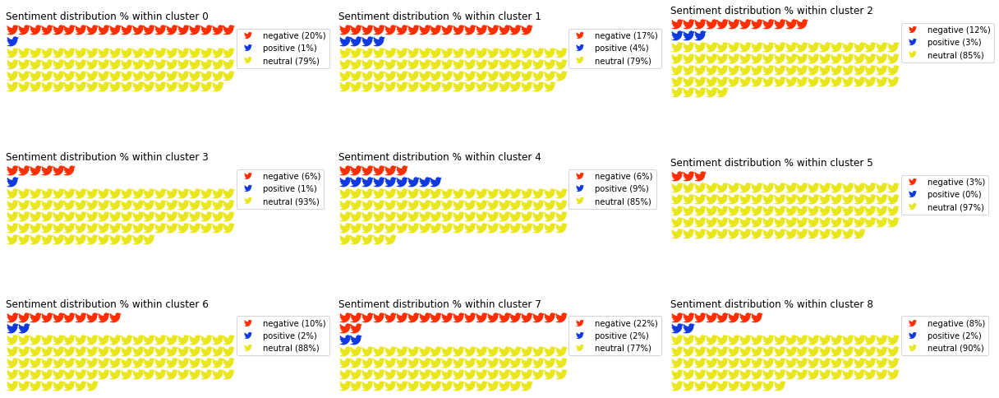

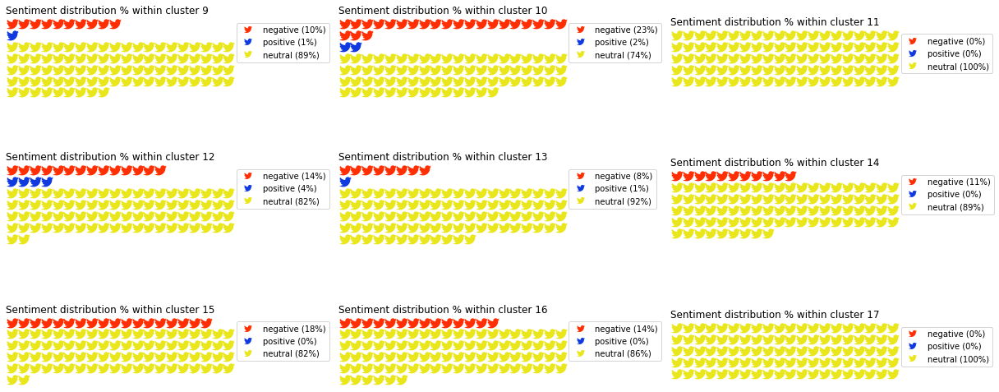

In [ ]:
fig1 = plt.figure(
    FigureClass = Waffle, 
    plots = data_dict_viz1,
    columns = 20,
    vertical = True,
    starting_location = "NW",
    interval_ratio_x = 0.1,
    interval_ratio_y = 0.1, 
    colors=("#ff2f03", "#103ae0", "#e9e61c"),  # shared parameter among subplots
    icons= 'twitter', #twitter-square',
    icon_style = "brands",
    icon_size=15, 
    icon_legend=True,
    legend = {'loc': 'upper left',
              'bbox_to_anchor': (1, 1)},
    block_arranging_style='new-line',
    figsize=(17, 15)
)

fig2 = plt.figure(
    FigureClass = Waffle, 
    plots = data_dict_viz2,
    columns = 20,
    vertical = True,
    starting_location = "NW",
    interval_ratio_x = 0.1,
    interval_ratio_y = 0.1, 
    colors=("#ff2f03", "#103ae0", "#e9e61c"),  # shared parameter among subplots
    icons= 'twitter', #twitter-square',
    icon_style = "brands",
    icon_size=15, 
    icon_legend=True,
    legend = {'loc': 'upper left',
              'bbox_to_anchor': (1, 1)},
    block_arranging_style='new-line',
    figsize=(17, 15)
)

Si osserva che:
* per tutti i cluster la maggioranza è costituita da tweet neutri
* il cluster 11 e 17 sono completamente neutri, (11 CISL)
* L'unico cluster in cui la percentuale di tweet positivi prevale su quella di negativi, anche se di poco, è il cluster 4

## Visualizzazione distribuzione sentiment

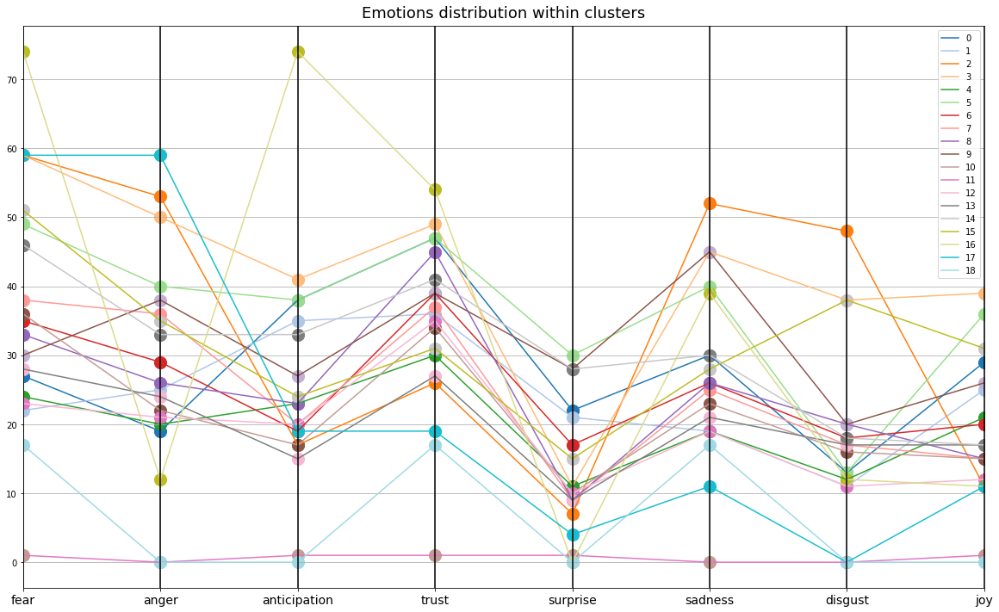

In [ ]:
#Colors
cmap = plt.get_cmap('tab20')
my_colors = list(cmap.colors)
my_colors[17] = (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)
my_colors[18] = (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)

fig, ax = plt.subplots(figsize=(20,12))

#Lines
parallel_coordinates(df_cluster.loc[:18][df_cluster.columns[3:11]].reset_index(), 
                     'cluster',
                     colormap=cmap, ax=ax , linewidth=1.5, linestyle ="solid", axvlines_kwds={"color":"black"})

#Points
i = 0
emotions = df_cluster.columns[3:11]

for _, row in df_cluster.loc[:18][df_cluster.columns[3:11]].iterrows():
  ax.scatter(emotions, row.tolist(), marker = "o", s = 200, c = [my_colors[i]]) 
  i+=1

# Axes
#ax.legend_.remove()
plt.title("Emotions distribution within clusters", 
          pad = 10.0,
          fontsize = 18)
plt.xticks(fontsize=14) #, rotation=90

plt.show()

Si osserva che il cluster 11 senza alcuna emozione rilevante, risultato che non sorprende visto quanto osservato per la sentiment